# Seoul Bike Sharing Demand Prediction


github repo link :- https://github.com/Puneet-Suthar/Bike-sharing-and-demand-prediciton

## <b> Problem Description </b>

### Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.


## <b> Data Description </b>

### <b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of the day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

# **Data Prepration**

## Importing and Inspecting Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from datetime import datetime
import datetime as dt

from scipy.stats import skew
import math

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')

## Overview of Data

In [2]:
# loading the dataset 

df = pd.read_csv('SeoulBikeData.csv', encoding= 'unicode_escape')

In [3]:
# Viewing the data of top 5 rows to take a glimps of the data
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [4]:
# View the data of bottom 5 rows to take a glimps of the data
df.tail()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [5]:
# Shape of dataset
df.shape

(8760, 14)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [7]:
#Rename the complex columns name
df=df.rename(columns={'Rented Bike Count':'Rented_Bike_Count',
                                'Temperature(°C)':'Temperature',
                                'Humidity(%)':'Humidity',
                                'Wind speed (m/s)':'Wind_speed',
                                'Visibility (10m)':'Visibility',
                                'Dew point temperature(°C)':'Dew_point_temperature',
                                'Solar Radiation (MJ/m2)':'Solar_Radiation',
                                'Rainfall(mm)':'Rainfall',
                                'Snowfall (cm)':'Snowfall',
                                'Functioning Day':'Functioning_Day'})

In [8]:
# Checking number of Zeros.
from tabulate import tabulate
data = []
for col in df.columns:
    data.append([f'{col}' , f'{(df[col] == 0).sum()}'])

print(tabulate(data))

---------------------  ----
Date                      0
Rented_Bike_Count       295
Hour                    365
Temperature              21
Humidity                 17
Wind_speed               74
Visibility                0
Dew_point_temperature    60
Solar_Radiation        4300
Rainfall               8232
Snowfall               8317
Seasons                   0
Holiday                   0
Functioning_Day           0
---------------------  ----


In [9]:
# Checking Duplicate Values
value=len(df[df.duplicated()])
print("The number of duplicate values in the data set is = ",value)

The number of duplicate values in the data set is =  0


In [10]:
#print the unique value
df.nunique()

Date                      365
Rented_Bike_Count        2166
Hour                       24
Temperature               546
Humidity                   90
Wind_speed                 65
Visibility               1789
Dew_point_temperature     556
Solar_Radiation           345
Rainfall                   61
Snowfall                   51
Seasons                     4
Holiday                     2
Functioning_Day             2
dtype: int64

In [11]:
df.columns

Index(['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day'],
      dtype='object')

In [12]:
#print the  value of categorical data
sel_col = ['Seasons','Hour','Holiday', 'Functioning_Day','Visibility']
for col in sel_col:
    print(col,':-')
    print(df[col].value_counts())
    print('--------------------------------------------')

Seasons :-
Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: Seasons, dtype: int64
--------------------------------------------
Hour :-
0     365
1     365
22    365
21    365
20    365
19    365
18    365
17    365
16    365
15    365
14    365
13    365
12    365
11    365
10    365
9     365
8     365
7     365
6     365
5     365
4     365
3     365
2     365
23    365
Name: Hour, dtype: int64
--------------------------------------------
Holiday :-
No Holiday    8328
Holiday        432
Name: Holiday, dtype: int64
--------------------------------------------
Functioning_Day :-
Yes    8465
No      295
Name: Functioning_Day, dtype: int64
--------------------------------------------
Visibility :-
2000    2245
1995      34
1985      28
1999      28
1989      28
        ... 
892        1
1656       1
1851       1
627        1
1688       1
Name: Visibility, Length: 1789, dtype: int64
--------------------------------------------


**Inferences :-**
1. We can see that Non functioning days are 295 but this count is including hours
2. and holidays are 432 which are also including count of hours a day.
3. So, Actual NON Functioning days are 295/24 = 12.291 (Which should be a int not float if 24 hrs of Non functioning days are non functioning )
4. and Actual holidays = 432/24 = 18

In [13]:
df[(df['Functioning_Day'] =='No') & (df['Rented_Bike_Count'] != 0)].count()

Date                     0
Rented_Bike_Count        0
Hour                     0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Snowfall                 0
Seasons                  0
Holiday                  0
Functioning_Day          0
dtype: int64

Above code confirms that No bikes are rented on Non Functioning day even though on extreme hours

In [14]:
df.describe(include = 'all')

,Date,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,01/12/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


**Inferences :**

1. This Dataset contains 8760 lines and 14 columns.
2.  Some columns have very high No. of Zeros :-

		a. Solar Radiation (MJ/m2) - 4300
		b. Rainfall(mm) - 8232 
		c. Snowfall (cm) - 8317
		
2. In a day we have 24 hours and we have 365 days a year so 365 X 24 = 8760, which are the no.of lines in the given dataset. 
3. 'Seasons','Holiday', 'Functioning Day','Hour' are the categorical columns.
4. No null values
5. No duplicated value.

**Need to do :**

1. Need to convert Date in date time type and extract date, month and year column.
2. Need to encoding for seasons, Holiday, Functioning Day


# **Feature Engineeing** (Before EDA)


In [15]:
# Converting Date to datetime object and extracting Date, month, year, week days

df['Date']=pd.to_datetime(df['Date'])
df['Year']=df['Date'].dt.year
df['Month']=df['Date'].dt.month
df['Day']=df['Date'].dt.day
df['WeekDay']=df['Date'].dt.day_name()

In [16]:
df_1 = df.groupby(['Functioning_Day','WeekDay'])
df_1.first()

Date  Rented_Bike_Count  Hour  Temperature  \
Functioning_Day WeekDay                                                      
No              Friday    2018-10-05                  0     0         14.5   
                Monday    2018-09-10                  0     0         12.6   
                Saturday  2018-02-10                  0     0         13.0   
                Sunday    2018-11-04                  0     0         14.4   
                Tuesday   2018-09-18                  0     0         19.5   
                Wednesday 2018-09-19                  0     0         21.0   
Yes             Friday    2017-05-12                216     0         -6.1   
                Monday    2017-06-12                145     0         -2.8   
                Saturday  2017-08-12                233     0         -3.5   
                Sunday    2017-02-12                328     0         -1.8   
                Thursday  2017-01-12                254     0         -5.2   
                Tuesday   2017-09-12                267     0         -3.5   
                Wednesday 2017-04-12                285     0          4.2   

                           Humidity  Wind_speed  Visibility  \
Functioning_Day WeekDay                                       
No              Friday           63         0.9        2000   
                Monday           54         0.2        2000   
                Saturday         72         1.8        1987   
                Sunday           82         4.6        1041   
                Tuesday          73         1.2        1916   
                Wednesday        66         0.4        2000   
Yes             Friday           42         2.6        2000   
                Monday           77         0.0         331   
                Saturday         49         2.6        1893   
                Sunday           87         1.1         994   
                Thursday         37         2.2        2000   
                Tuesday          48         0.9        1967   
                Wednesday        88         0.6         216   

                           Dew_point_temperature  Solar_Radiation  Rainfall  \
Functioning_Day WeekDay                                                       
No              Friday                       7.5              0.0       0.0   
                Monday                       3.5              0.0       0.0   
                Saturday                     8.0              0.0       0.0   
                Sunday                      11.3              0.0       0.0   
                Tuesday                     14.5              0.0       0.0   
                Wednesday                   14.3              0.0       0.0   
Yes             Friday                     -16.9              0.0       0.0   
                Monday                      -6.2              0.0       0.1   
                Saturday                   -12.6              0.0       0.0   
                Sunday                      -3.6              0.0       0.0   
                Thursday                   -17.6              0.0       0.0   
                Tuesday                    -12.9              0.0       0.0   
                Wednesday                    2.3              0.0       0.0   

                           Snowfall Seasons     Holiday  Year  Month  Day  
Functioning_Day WeekDay                                                    
No              Friday          0.0  Spring  No Holiday  2018     10    5  
                Monday          0.0  Autumn     Holiday  2018      9   10  
                Saturday        0.0  Autumn  No Holiday  2018      2   10  
                Sunday          0.0  Spring  No Holiday  2018     11    4  
                Tuesday         0.0  Autumn  No Holiday  2018      9   18  
                Wednesday       0.0  Autumn  No Holiday  2018      9   19  
Yes             Friday          0.0  Winter  No Holiday  2017      5   12  
                Monday          0.1  Winter  

According to above groupby functioning day doesnt work for weekends

In [17]:
# creating new column for weekend (yes or no)

df["Weekend"] = df['WeekDay'].apply(lambda x : 'yes' if x in ['Saturday','Sunday'] else 'No')

In [18]:
df.head()

,Date,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Year,Month,Day,WeekDay,Weekend
0,2017-01-12,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
1,2017-01-12,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
2,2017-01-12,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
3,2017-01-12,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
4,2017-01-12,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No


In [19]:
# Dropping unwanted column

df = df.drop(["Date"],axis=1)

# Exploratory Data Analysis

## Univariate analysis

### Distplot

In [20]:
# Selecting column having only numbers
num_col = df.select_dtypes(include=np.number).columns
num_col

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Year', 'Month', 'Day'],
      dtype='object')

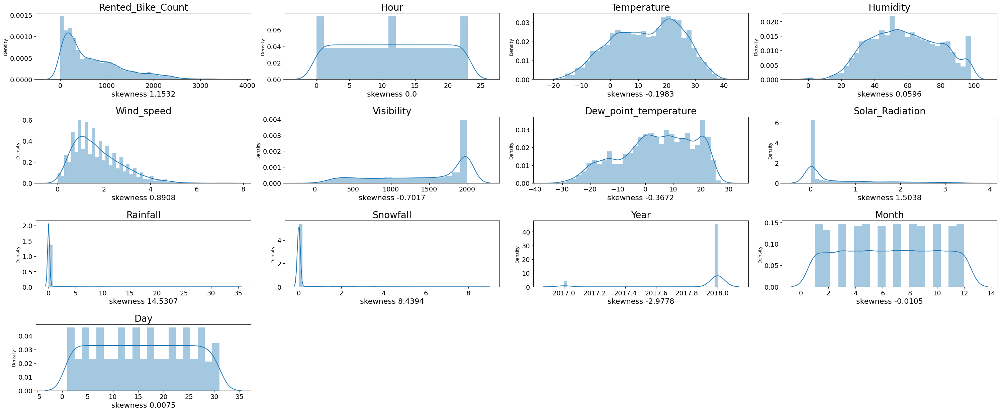

In [21]:
plt.figure(figsize=(30,15))

for n,col in enumerate(num_col):
    plt.subplot(5, 4, n+1)
    sns.distplot(df[col])
    
    # modify individual font size of elements
    plt.xlabel(f'skewness {round(skew(df[col]),4)}', fontsize=16);
    plt.title(f'{col}', fontsize=20)
    plt.tick_params(axis='both', which='major', labelsize=14)

    plt.tight_layout(h_pad = 2)

From above graph we can see that some of features are highly skewed which can effect our model.
So we need to apply some transformation on them to normalize them.

### Box Plot

In [22]:
cat_col = [i for i in df.columns if i not in df.describe().columns]
print(cat_col)
num_col = [i for i in df.columns if i in df.describe().columns]
print(num_col)

['Seasons', 'Holiday', 'Functioning_Day', 'WeekDay', 'Weekend']
['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Year', 'Month', 'Day']


In [23]:
#cat_col = ['Hour', 'Seasons', 'Holiday', 'Functioning_Day', 'Year', 'Month','Day', 'WeekDay', 'Weekend']
#num_col = ['Rented_Bike_Count','Temperature', 'Humidity', 'Wind_speed','Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall','Snowfall']

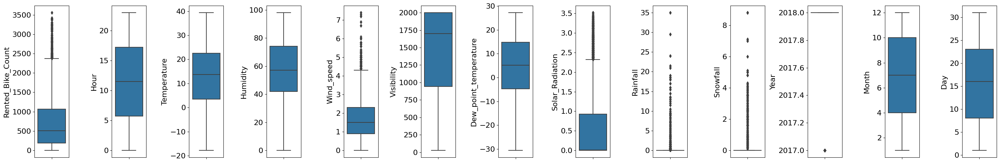

In [24]:
plt.figure(figsize=(30,5))

for n,col in enumerate(num_col):
    plt.subplot(1, 13, n+1)
    sns.boxplot(y = col, data= df)
    
    # modify individual font size of elements
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(col, fontsize=16)

    plt.tight_layout(h_pad = 2)

<AxesSubplot: ylabel='Solar_Radiation'>

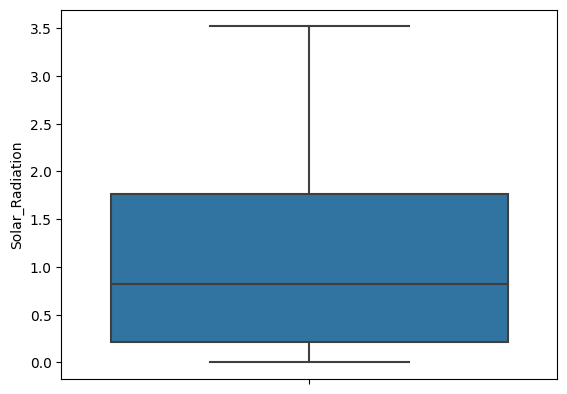

In [28]:
sns.boxplot(y = 'Solar_Radiation', data= df[(df['Hour'] >6)&(df['Hour'] <20)])

### Outliers

In [25]:
# This function gives the dataframe of upper and lower whiskers used in box plot and num of rows above and below those whiskers
def whiskers_df(main_df,col_list):

    # This function takes data as input and gives upper and lower whisker
    def whiskers(data):
        median = np.median(data)
        upper_quartile = np.percentile(data, 75)
        lower_quartile = np.percentile(data, 25)

        iqr = upper_quartile - lower_quartile
        #upper_whisker = data[data<=upper_quartile+1.5*iqr].max()
        #lower_whisker = data[data>=lower_quartile-1.5*iqr].min()

        upper_whisker = upper_quartile+1.5*iqr
        lower_whisker = lower_quartile-1.5*iqr
        return upper_whisker, lower_whisker

    upper_whisker = []
    lower_whisker = []
    data_above_upper_whisker = []
    data_below_lower_whisker = []
    outlier_per =[]
    
    outlier_index_upper = []
    outlier_index_lower = []

    index_count = 0
    
    for i in col_list:
        upper_whisker.append(whiskers(main_df[i])[0])
        lower_whisker.append(whiskers(main_df[i])[1])
        data_above_upper_whisker.append(main_df.loc[main_df[i] > whiskers(main_df[i])[0]].shape[0])
        data_below_lower_whisker.append(main_df.loc[main_df[i] < whiskers(main_df[i])[1]].shape[0])
        outlier_per.append(round((data_above_upper_whisker[index_count] + data_below_lower_whisker[index_count])*100/df.shape[0],2))

        
        outlier_index_lower = outlier_index_lower + [i for i in (main_df.loc[main_df[i] < whiskers(main_df[i])[1]].index)]
        outlier_index_upper = outlier_index_upper + [i for i in (main_df.loc[main_df[i] > whiskers(main_df[i])[0]].index)]

        index_count = index_count + 1

    all_outlier_index = outlier_index_upper + outlier_index_lower
    all_outlier_index = set(all_outlier_index)

    whisker_df = pd.DataFrame(
        {'feature' : col_list,
        'upper_whisker' : upper_whisker,
        'data_above_upper_whisker': data_above_upper_whisker,
        'lower_whisker' : lower_whisker,
        'data_below_lower_whisker': data_below_lower_whisker,
        'outlier_per' : outlier_per
        }
    )    
    whisker_df = whisker_df.set_index('feature')
    
    print(f'Total No. of rows in dataframe                       - {df.shape[0]}')
    outlier_per_total = (len(all_outlier_index))*100/(df.shape[0])
    print(f'Total rows containing outliers in data               - {len(all_outlier_index)}')
    print(f'Percentage of total rows containing outliers in data - {round(outlier_per_total,2)}%')
    display(whisker_df)

    return whisker_df

In [26]:
outlier_check_col = ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall']
wskr_df = whiskers_df(df,outlier_check_col)

Total No. of rows in dataframe                       - 8760
Total rows containing outliers in data               - 1838
Percentage of total rows containing outliers in data - 20.98%


,upper_whisker,data_above_upper_whisker,lower_whisker,data_below_lower_whisker,outlier_per
feature,,,,,
Rented_Bike_Count,2376.625,158,-1120.375,0,1.80
Hour,34.500,0,-11.500,0,0.00
Temperature,51.000,0,-25.000,0,0.00
Humidity,122.000,0,-6.000,0,0.00
Wind_speed,4.400,161,-1.200,0,1.84
Visibility,3590.000,0,-650.000,0,0.00
Dew_point_temperature,44.050,0,-33.950,0,0.00
Solar_Radiation,2.325,641,-1.395,0,7.32
Rainfall,0.000,528,0.000,0,6.03


In [27]:
# replacing some outliers with median
sel_cols = ['Rented_Bike_Count','Wind_speed']

for i in sel_cols:
    replace_by = df[i].median()
    df[i] = np.where((df[i] > wskr_df.loc[i,'upper_whisker']) ,replace_by, df[i])
    df[i] = np.where((df[i] < wskr_df.loc[i,'lower_whisker']) ,replace_by, df[i])


(8760, 18)


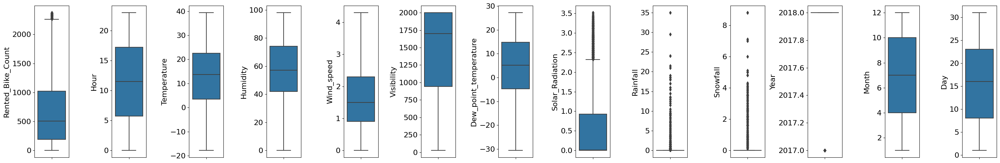

In [28]:
# Box plot after outlier removal
print(df.shape)


plt.figure(figsize=(30,5))

for n,col in enumerate(num_col):
    plt.subplot(1, 13, n+1)
    sns.boxplot(y = col, data= df)
    
    # modify individual font size of elements
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(col, fontsize=16)

    plt.tight_layout(h_pad = 2)

In [29]:
outlier_check_col = ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall']
wskr_df = whiskers_df(df,outlier_check_col)

Total No. of rows in dataframe                       - 8760
Total rows containing outliers in data               - 1679
Percentage of total rows containing outliers in data - 19.17%


,upper_whisker,data_above_upper_whisker,lower_whisker,data_below_lower_whisker,outlier_per
feature,,,,,
Rented_Bike_Count,2263.500,96,-1052.500,0,1.10
Hour,34.500,0,-11.500,0,0.00
Temperature,51.000,0,-25.000,0,0.00
Humidity,122.000,0,-6.000,0,0.00
Wind_speed,4.400,0,-1.200,0,0.00
Visibility,3590.000,0,-650.000,0,0.00
Dew_point_temperature,44.050,0,-33.950,0,0.00
Solar_Radiation,2.325,641,-1.395,0,7.32
Rainfall,0.000,528,0.000,0,6.03


## Bivariate

### Regression plot 

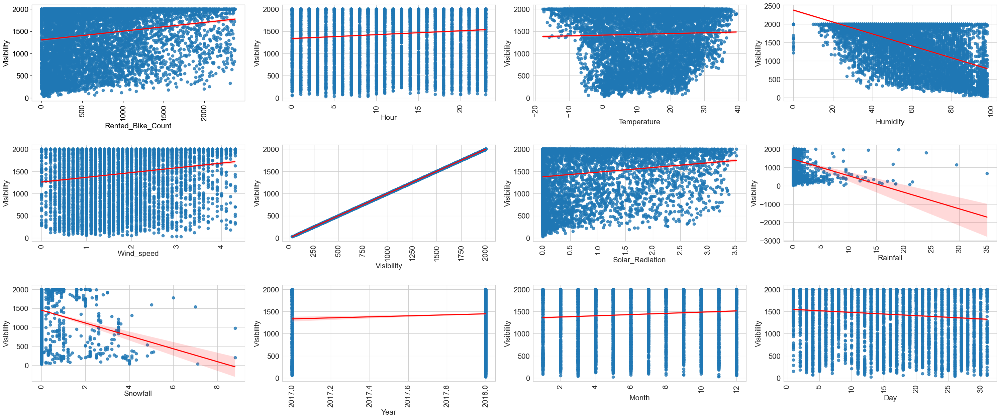

In [30]:
# regression plot 
#sel_col = ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed','Visibility', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Year', 'Month', 'Day']

plt.figure(figsize=(30,20))

x_lable_sel_col =  ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed','Visibility', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Year', 'Month', 'Day']
y_lable_col = 'Visibility'

for n,col in enumerate(x_lable_sel_col):
    plt.subplot(5, 4, n+1)
    sns.regplot(data = df,y= df[y_lable_col], x= df[f'{col}'],line_kws={"color": "red"})
    #sns.barplot(y= df[y_lable_col], x= df[f'{col}'])

    # modify individual font size of elements
    sns.set_style('whitegrid')
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(y_lable_col, fontsize=16)
    plt.xlabel(col, fontsize=16)
    plt.xticks(rotation=90)

    plt.tight_layout(h_pad = 2)

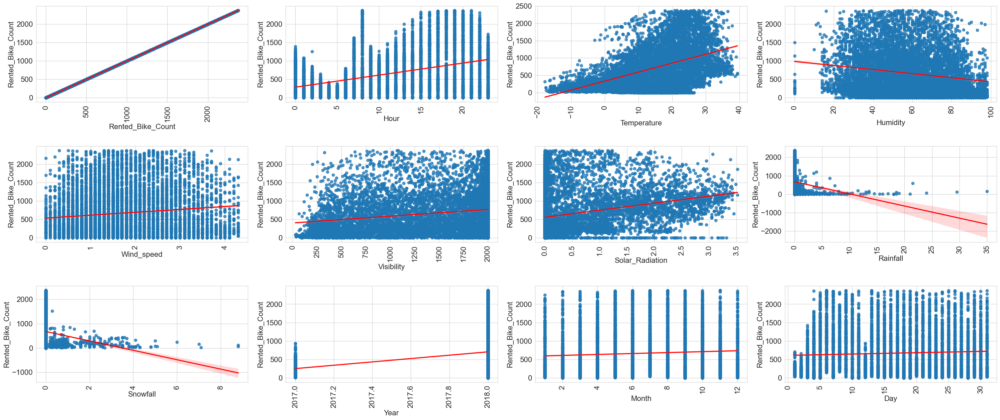

In [31]:
# regression plot 
#sel_col = ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed','Visibility', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Year', 'Month', 'Day']

plt.figure(figsize=(30,20))

x_lable_sel_col =  ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed','Visibility', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Year', 'Month', 'Day']
y_lable_col = 'Rented_Bike_Count'

for n,col in enumerate(x_lable_sel_col):
    plt.subplot(5, 4, n+1)
    sns.regplot(data = df,y= df[y_lable_col], x= df[f'{col}'],line_kws={"color": "red"})
    #sns.barplot(y= df[y_lable_col], x= df[f'{col}'])

    # modify individual font size of elements
    sns.set_style('whitegrid')
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(y_lable_col, fontsize=16)
    plt.xlabel(col, fontsize=16)
    plt.xticks(rotation=90)

    plt.tight_layout(h_pad = 2)

Most of the features Doesn't show any linear relationship with target column

### Line plots

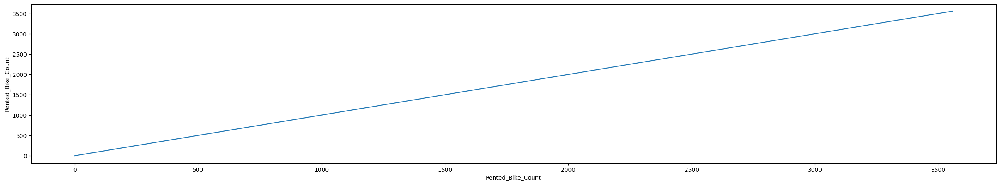

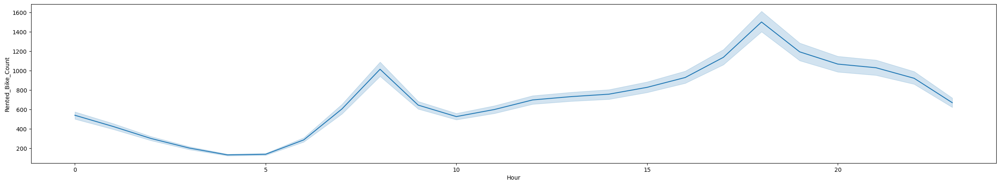

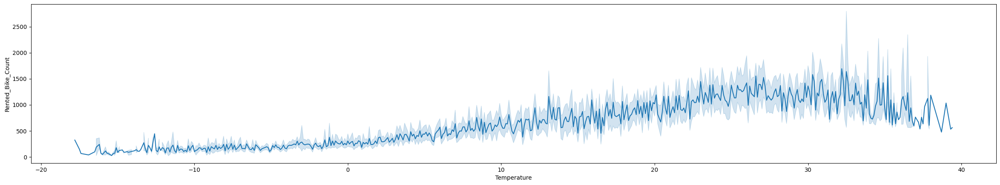

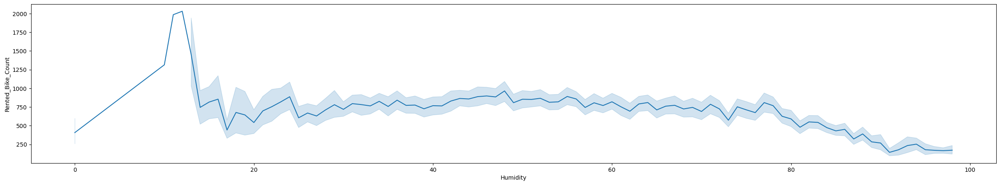

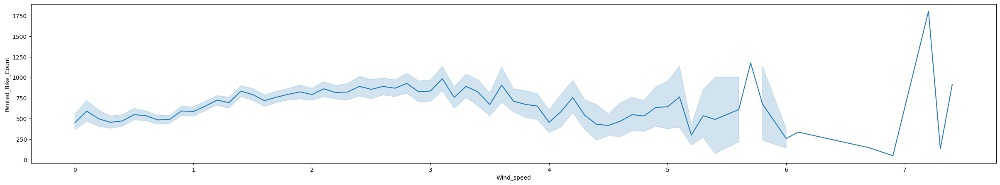

...

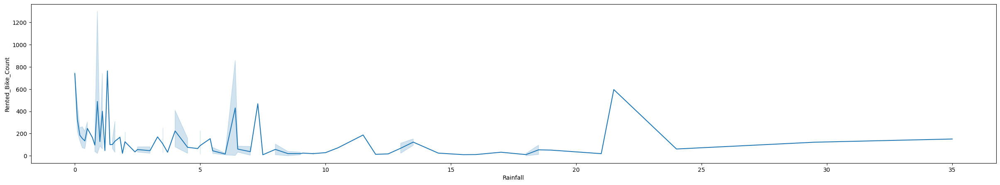

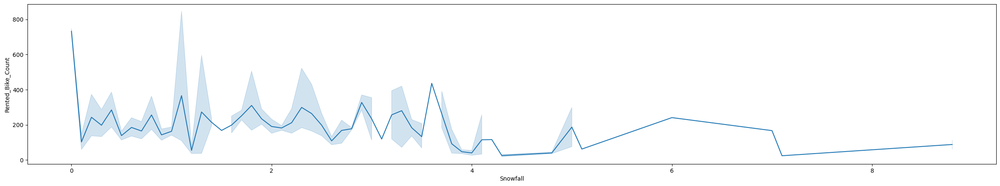

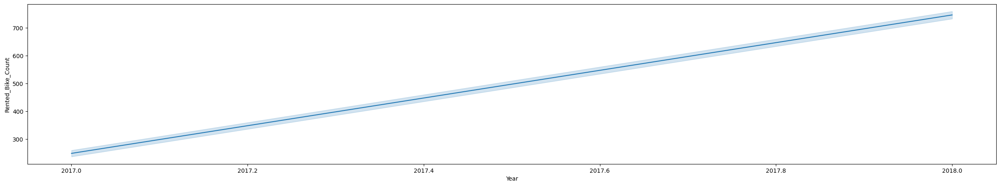

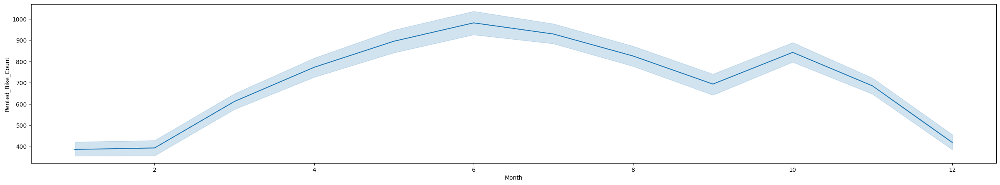

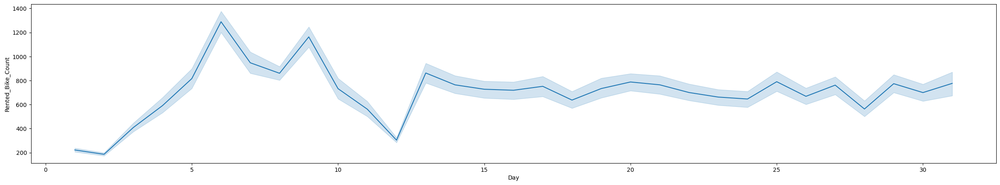

In [30]:
#for numerical columns
for i in num_col:
  plt.figure(figsize=(30,5))
  sns.lineplot(x=i,y='Rented_Bike_Count',data=df,palette='Grouped')

In [ ]:
# for categorical columns
for i in cat_col:
  plt.figure(figsize=(30,5))
  sns.lineplot(x=i,y='Rented_Bike_Count',data=df,palette='Grouped')

### Bar Plot

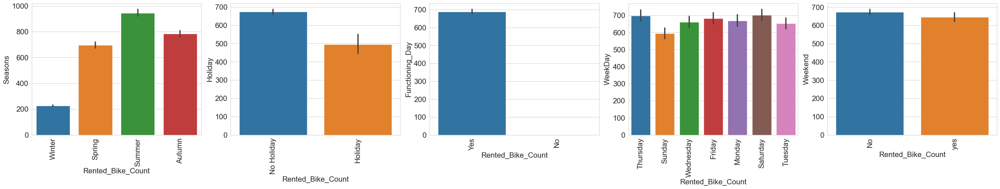

In [32]:
plt.figure(figsize=(30,10))

x_lable_sel_col =  cat_col
y_lable_col = 'Rented_Bike_Count'

for n,col in enumerate(x_lable_sel_col):
    plt.subplot(2, 5, n+1)
    sns.barplot(y= df[y_lable_col], x= df[f'{col}'])

    # modify individual font size of elements
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(col, fontsize=16)
    plt.xlabel(y_lable_col, fontsize=16)
    plt.xticks(rotation=90)

    plt.tight_layout(h_pad = 2)

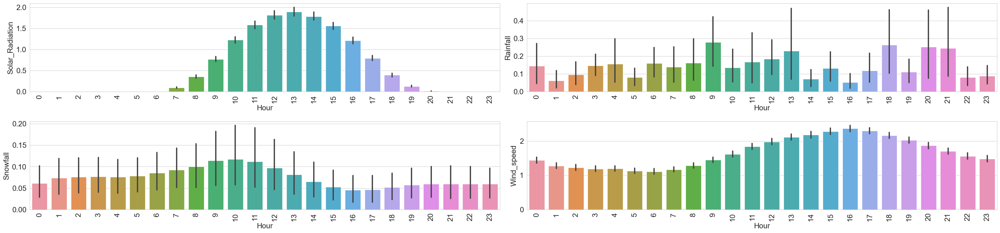

In [33]:
plt.figure(figsize=(30,10))

x_lable_sel_col =  ['Solar_Radiation','Rainfall','Snowfall','Wind_speed',]
y_lable_col = 'Hour'

for n,col in enumerate(x_lable_sel_col):
    plt.subplot(3, 2, n+1)
    sns.barplot(x= df[y_lable_col], y= df[f'{col}'])

    # modify individual font size of elements
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(col, fontsize=16)
    plt.xlabel(y_lable_col, fontsize=16)
    plt.xticks(rotation=90)

    plt.tight_layout(h_pad = 2)

Solar radiation outliers are not outliers, In the dataset this column contains 0 in most of the cell, 
this is because of sunshine hours in a day are less than non sun hours 

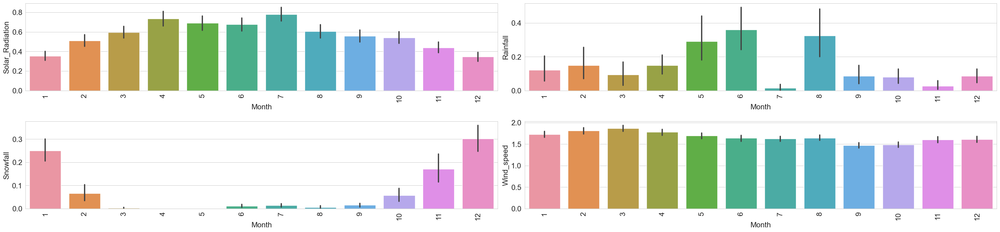

In [34]:
plt.figure(figsize=(30,10))

x_lable_sel_col =  ['Solar_Radiation','Rainfall','Snowfall','Wind_speed',]
y_lable_col = 'Month'

for n,col in enumerate(x_lable_sel_col):
    plt.subplot(3, 2, n+1)
    sns.barplot(x= df[y_lable_col], y= df[f'{col}'])

    # modify individual font size of elements
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(col, fontsize=16)
    plt.xlabel(y_lable_col, fontsize=16)
    plt.xticks(rotation=90)

    plt.tight_layout(h_pad = 2)

There is a huge impact on Solar_Radiation, Rainfall and Snowfall in different months

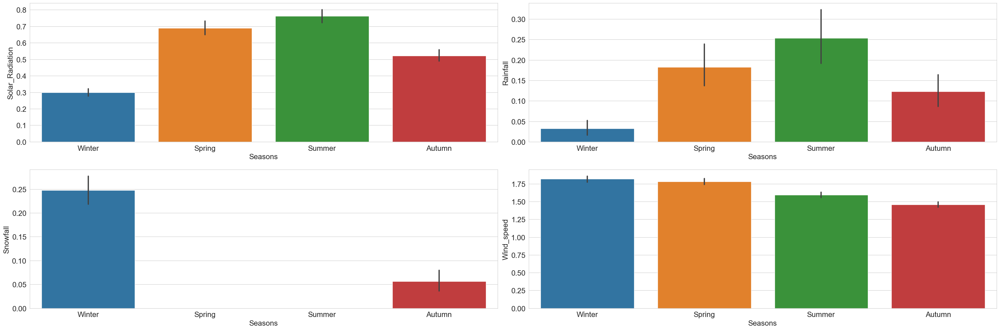

In [35]:
plt.figure(figsize=(30,10))

x_lable_sel_col =  ['Solar_Radiation','Rainfall','Snowfall','Wind_speed']
y_lable_col = 'Seasons'

for n,col in enumerate(x_lable_sel_col):
    plt.subplot(2, 2, n+1)
    sns.barplot(x= df[y_lable_col], y= df[f'{col}'])

    # modify individual font size of elements
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.ylabel(col, fontsize=16)
    plt.xlabel(y_lable_col, fontsize=16)
    #plt.xticks(rotation=90)

    plt.tight_layout(h_pad = 2)

As we can see the snow fall and rainfall are highly related to the seasons, so these are the outliers, but this the data is correct.

## Multivariate 

### Corelation 

In [36]:
corr_mat = df.corr()

<AxesSubplot: >

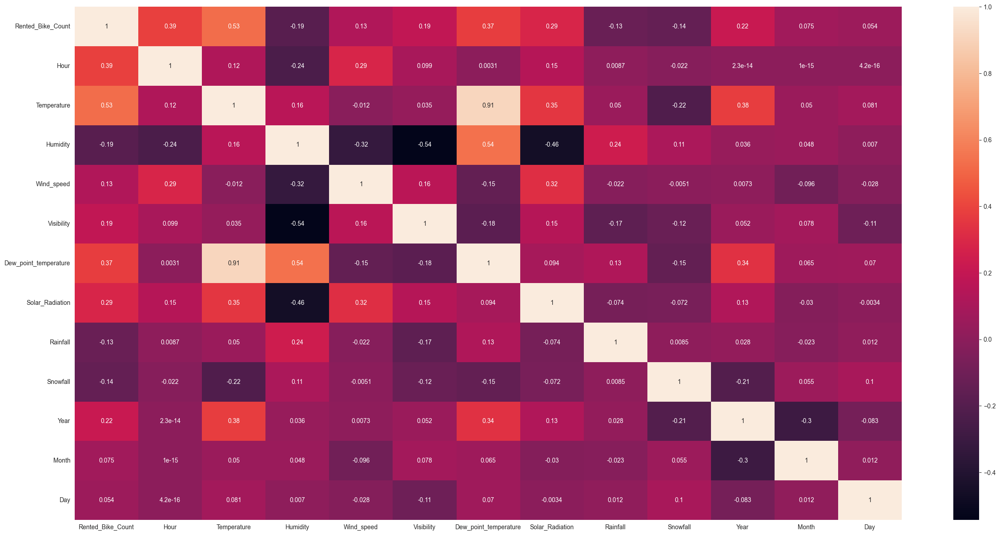

In [37]:
# heat map
plt.figure(figsize = (30,15))
sns.heatmap(corr_mat, annot = True)

As discussed in above Displot section,we need to fix skewness of some features:

1. Rented_Bike_Count
2. Wind_speed
3. Visibility
4. Solar_Radiation
5. Rainfall
6. Snowfall

Selected:- Snowfall, Rainfall , Solar_radiation, wind_speed, visibility



In [38]:
df.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Year', 'Month',
       'Day', 'WeekDay', 'Weekend'],
      dtype='object')

In [39]:
# Function to find collerated data more than threshold value 

def correlation(df, threshold):
  correlated_cols = set()
  corr_matrix = df.corr()
  for i in range(len(corr_matrix.columns)):
    for j in range(i):
      if abs(corr_matrix.iloc[i,j]) > threshold:
          colname = corr_matrix.columns[i]
          correlated_cols.add(colname)
  return correlated_cols

# highly correlated column 

corr_colmns = correlation(df, 0.9)
corr_colmns


{'Dew_point_temperature'}

In [40]:
# Dropping highly correlated column 
df.drop(corr_colmns, axis = 1, inplace = True)
print(corr_colmns)
df.columns

{'Dew_point_temperature'}


Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons',
       'Holiday', 'Functioning_Day', 'Year', 'Month', 'Day', 'WeekDay',
       'Weekend'],
      dtype='object')

### Pair Plot

<Figure size 2000x2000 with 0 Axes>

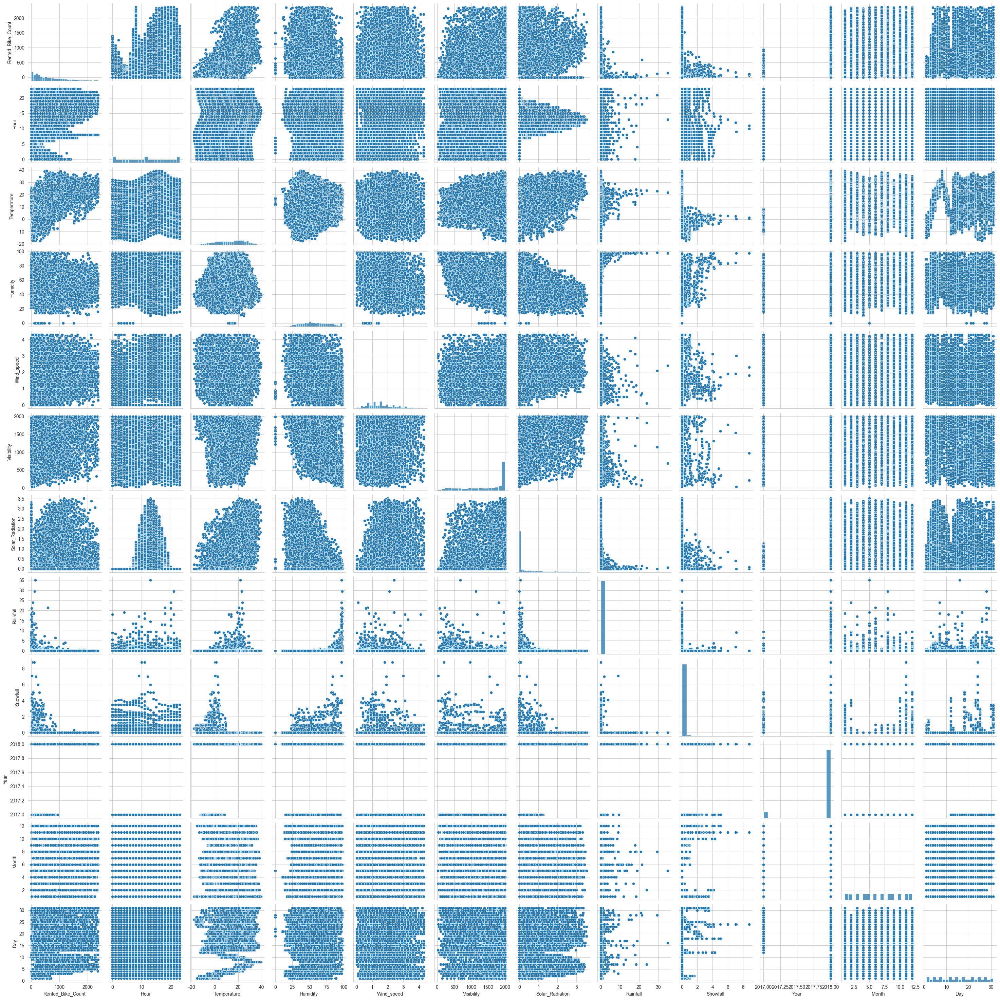

In [41]:
plt.figure(figsize=(20,20))
sns.pairplot(df)

## Inferences :- 

1. low bike count in 2017, high bike count in 2018.
2. 2 peaks are observed in 24 hours ( 8:00 and 18:00)
3. Bike count increase as temp increased.
4. Low humidty high bike count , high humidity low bike count.
5. low bike count in high wind speed, (a suprising peak at 7.2 and 7.4 m/s)
6. Slightly inclination towards high solar radiation.
7. Too many peaks in rainfall need to examin again.
8. Demand is high in no snowfall, moderate in light snowfall, less in heavy snowfall.
9. Demand is high in summer > Autumn > Spring > Winter.
10. Holiday> No holidays.
11. Heighest peaks in 5,6,7 months
12. Count is abnormal before 13 of evey month.
13. Count least on sunday.

# **Feature Engineeing** (After EDA)

## Encoding

In [42]:
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Year,Month,Day,WeekDay,Weekend
0,254.0,0,-5.2,37,2.2,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
1,204.0,1,-5.5,38,0.8,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
2,173.0,2,-6.0,39,1.0,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
3,107.0,3,-6.2,40,0.9,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
4,78.0,4,-6.0,36,2.3,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No


In [43]:
# lable encoding
le = LabelEncoder()
sel_col = ['Seasons','Holiday', 'Functioning_Day','WeekDay', 'Weekend']
for col in sel_col:
    df[col]= le.fit_transform(df[col])

In [44]:
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Year,Month,Day,WeekDay,Weekend
0,254.0,0,-5.2,37,2.2,2000,0.0,0.0,0.0,3,1,1,2017,1,12,4,0
1,204.0,1,-5.5,38,0.8,2000,0.0,0.0,0.0,3,1,1,2017,1,12,4,0
2,173.0,2,-6.0,39,1.0,2000,0.0,0.0,0.0,3,1,1,2017,1,12,4,0
3,107.0,3,-6.2,40,0.9,2000,0.0,0.0,0.0,3,1,1,2017,1,12,4,0
4,78.0,4,-6.0,36,2.3,2000,0.0,0.0,0.0,3,1,1,2017,1,12,4,0


# Transformations

In [45]:
# Checking Skewness
print(df.skew()[abs(df.skew()) > 1])


Solar_Radiation     1.504040
Rainfall           14.533232
Snowfall            8.440801
Holiday            -4.163603
Functioning_Day    -5.170969
Year               -2.978262
dtype: float64


As discussed in above Displot section,we need to fix skewness of some features:
1. Rented_Bike_Count
2. Wind_speed
3. Visibility
4. Solar_Radiation
5. Rainfall
6. Snowfall

Selected:- Snowfall, Rainfall , Solar_radiation, wind_speed, visibility



## Handeling skewed features

In [46]:
#skewed = ['Rented_Bike_Count', 'Solar_Radiation', 'Rainfall', 'Snowfall']
skewed = ['Rented_Bike_Count']
trans_df = df.copy()

In [47]:
# Rented_Bike_Count
trans_df['Rented_Bike_Count'] = np.sqrt(trans_df['Rented_Bike_Count'])

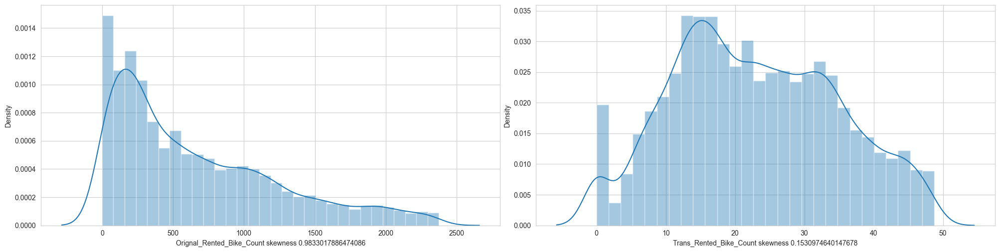

In [48]:
# Check skewness difference

ncol = 2
nrow = 1

fig, axis = plt.subplots(ncols = ncol, nrows =nrow, figsize = (20, 5))
index = 0
axis = axis.flatten()

for col in skewed:

  p = sns.distplot(df[col], ax = axis[index])
  p.set_xlabel(f'Orignal_{col} skewness {skew(df[col])}')
   
  index = index +1
    
  q = sns.distplot(trans_df[col], ax = axis[index])
  q.set_xlabel(f'Trans_{col} skewness {skew(trans_df[col])}')  
    
  index = index +1

plt.tight_layout(pad = 0.5, w_pad = 0.5, h_pad = 5)

## Feature and target spliting

In [49]:
# Feature and target

X_data = trans_df.drop(['Rented_Bike_Count'], axis = 1)

# Applying MinMax Scaler
scaler = MinMaxScaler()
X_data = pd.DataFrame(data = scaler.fit_transform(X_data), columns= X_data.columns)

y_data = trans_df['Rented_Bike_Count']

# Model Building

### Model Defining

In [50]:
# Importing Libraries

# linear Models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet

LR = LinearRegression()
R = Ridge()
La = Lasso()
En = ElasticNet()

# Non linear models

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor

RF = RandomForestRegressor()
DT = DecisionTreeRegressor()
GBR = GradientBoostingRegressor()

models_list = [LR,La,R, En, DT, RF,GBR]

### Hyper parameter tuning

In [68]:
# creating a dictionary that contains hyperparameter values for the above mentioned models

from scipy.stats import loguniform

model_hyperparameters = {
    

    'LinearRegression_hyperparameters': {
        
        'fit_intercept' : [True,False],
        'copy_X' : [True,False],
        'positive' : [True,False],
    },

    'Ridge_hyperparameters': {
        
        'alpha': [float(x) for x in np.linspace(start = 0.1, stop = 0.3,num = 1000)],
        'fit_intercept' : [True,False],
        "solver" : ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs'],
        'positive' : [True,False],
    },


    'Lasso_hyperparameters' : {
        
        'alpha': [float(x) for x in np.linspace(start = 0.0001, stop = 1,num = 30)],
        'fit_intercept' : [True,False],
        'copy_X' : [True,False],
        'positive' : [True,False],
    
    },


    'ElasticNet_hyperparameters' : {
        
        'alpha' : [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0],
        'l1_ratio' : [float(x) for x in np.linspace(start = 0, stop = 1,num = 100)],
        'fit_intercept' : [True,False],
        'copy_X' : [True,False],
        'positive' : [True,False],
    
    },

    'RandomForestRegressor_hyperparameters' : {
        
        'n_estimators': [int(x) for x in np.linspace(start = 50, stop = 200,num = 10)],
        'max_features': ['sqrt', 'log2', None]
    },

    'DecisionTreeRegressor_hyperparameters' : {
        
        'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
        'max_depth': [int(x) for x in np.linspace(start = 5, stop = 50,num = 5)]
    },

    'GradientBoostingRegressor_hyperparameters' : {
        
        'max_depth' : [10],
        'min_samples_leaf' : [50,70],
        'random_state' : [4],
        "n_estimators": [50, 150]
    }

}

In [69]:
# This function takes required inputs and give the best parameters for models after grid search cv based on input scoring method
def ModelSelection(X,y,list_of_models, hyperparameters_dictionary,CV, scoring_method):
  
  from sklearn.model_selection import GridSearchCV
  from IPython.display import display

  result = []
  

  for model in list_of_models:
    
    model_name = str(model).split('(')[0]
    
    for i in hyperparameters_dictionary.keys() :
      if model_name in i :
        key = i
      else :
        pass

    params = hyperparameters_dictionary[key]

    print(model)
    #print(params)
    print('---------------------------------')


    classifier = GridSearchCV(model, params,scoring = scoring_method, cv=CV, n_jobs= -1)

    # fitting the data to classifier
    classifier.fit(X,y)

    result.append({
        'model used' : model,
        f'highest {scoring_method} score' : classifier.best_score_,
        'best hyperparameters' : classifier.best_params_
    })

  result_dataframe = pd.DataFrame(result, columns = ['model used',f'highest {scoring_method} score','best hyperparameters'])
  seldata = [f'highest {scoring_method} score']
  result_dataframe_formated = result_dataframe.style.highlight_max(subset= seldata, color = 'darkblue')
  
  display(result_dataframe_formated)

  return result_dataframe

In [70]:
models_list = [LR,La,R, En, DT, RF,GBR]
para_df = ModelSelection(X_data,y_data,models_list, model_hyperparameters,20,'neg_mean_absolute_error')

LinearRegression()
---------------------------------
Lasso()
---------------------------------
Ridge()
---------------------------------
ElasticNet()
---------------------------------
DecisionTreeRegressor()
---------------------------------
RandomForestRegressor()
---------------------------------
GradientBoostingRegressor()
---------------------------------


,model used,highest neg_mean_absolute_error score,best hyperparameters
0,LinearRegression(),-5.687872,"{'copy_X': True, 'fit_intercept': True, 'positive': False}"
1,Lasso(),-5.687823,"{'alpha': 0.0001, 'copy_X': True, 'fit_intercept': True, 'positive': False}"
2,Ridge(),-5.688480,"{'alpha': 0.1, 'fit_intercept': True, 'positive': False, 'solver': 'sag'}"
3,ElasticNet(),-5.687823,"{'alpha': 0.0001, 'copy_X': True, 'fit_intercept': True, 'l1_ratio': 1.0, 'positive': False}"
4,DecisionTreeRegressor(),-4.300701,"{'criterion': 'friedman_mse', 'max_depth': 16}"
5,RandomForestRegressor(),-3.391525,"{'max_features': None, 'n_estimators': 150}"
6,GradientBoostingRegressor(),-3.315588,"{'max_depth': 10, 'min_samples_leaf': 70, 'n_estimators': 150, 'random_state': 4}"


In [71]:
# Linear Models
LR = LinearRegression(**para_df['best hyperparameters'][0])
La =            Lasso(**para_df['best hyperparameters'][1])
R  =            Ridge(**para_df['best hyperparameters'][2])
En =       ElasticNet(**para_df['best hyperparameters'][3])

# Non Linear models
DT  =     DecisionTreeRegressor(**para_df['best hyperparameters'][4])
RF  =     RandomForestRegressor(**para_df['best hyperparameters'][5])
GBR = GradientBoostingRegressor(**para_df['best hyperparameters'][6])


In [72]:
"""# Redefining the models with best hyper parameters

# Linear Models
LR = LinearRegression(normalize = False)
R = Ridge(alpha= 0.3)
La = Lasso(alpha= 0.0001)
En = ElasticNet(alpha= 0.001, l1_ratio = 0.22222222222222224)

# Non Linear models
RF = RandomForestRegressor()
DT = DecisionTreeRegressor(criterion = 'friedman_mse', max_depth = 5)
GBR = GradientBoostingRegressor(max_depth=10,min_samples_leaf=50,min_samples_split=50,n_estimators=150, random_state=4)"""

"# Redefining the models with best hyper parameters\n\n# Linear Models\nLR = LinearRegression(normalize = False)\nR = Ridge(alpha= 0.3)\nLa = Lasso(alpha= 0.0001)\nEn = ElasticNet(alpha= 0.001, l1_ratio = 0.22222222222222224)\n\n# Non Linear models\nRF = RandomForestRegressor()\nDT = DecisionTreeRegressor(criterion = 'friedman_mse', max_depth = 5)\nGBR = GradientBoostingRegressor(max_depth=10,min_samples_leaf=50,min_samples_split=50,n_estimators=150, random_state=4)"

### Model Fitting

In [73]:
# Defining a function to train the input model and print evaluation matrix
def analyse_model(model, X_train, X_test, y_train, y_test):

  '''Takes regressor model and train test splits as input and prints the
  evaluation matrices with the plot and returns the model'''

  from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

  # Fitting the model
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  a,p = y_test,y_pred

  # Calculating Evaluation Matrix
  mse = mean_squared_error(a,p)
  rmse = np.sqrt(mse)
  r2 = r2_score(a,p)


  metric_df = pd.DataFrame()

  metric_df.loc[0, 'MSE'] = mse
  metric_df.loc[0, 'RMSE'] = rmse
  metric_df.loc[0, 'MAE'] = mean_absolute_error(a,p)
  metric_df.loc[0, 'Train_R2'] = r2_score(y_train**2,model.predict(X_train)**2)
  metric_df.loc[0, 'Test_R2'] = r2
  metric_df.loc[0, 'Adjusted_R2'] = 1-(1-r2)*((len(X_test)-1)/(len(X_test)-X_test.shape[1]-1))
  print(f'---------------------{model}----------------------')
  display(metric_df)

  try:
    importance = model.feature_importances_
  except:
    importance = model.coef_
  
  
  feature = X_train.columns
  feature_importance_df = pd.DataFrame({'Feature':feature,'Importance':importance})
  #feature_importance_df = feature_importance_df.sort_values(by='Importance',ascending=False)

  # Plotting actual and predicted values and the feature importances:
  plt.figure(figsize=(20,5))
  plt.subplot(2,1,1)
  plt.plot((y_pred)[:100])
  plt.plot((np.array(y_test)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.title('Actual and Predicted Bike Counts')
  
  plt.subplot(2,1,2)
  plt.bar(x = feature_importance_df['Feature'], height = feature_importance_df['Importance'])
  plt.xticks(rotation = 20)
  plt.title('Feature Importance')

  plt.tight_layout()
  plt.show()

  return model

In [75]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X_data, y_data , test_size = 0.2, random_state = 0)

---------------------LinearRegression()----------------------


,MSE,RMSE,MAE,Train_R2,Test_R2,Adjusted_R2
0,51.520957,7.17781,5.554322,0.547814,0.633682,0.630304


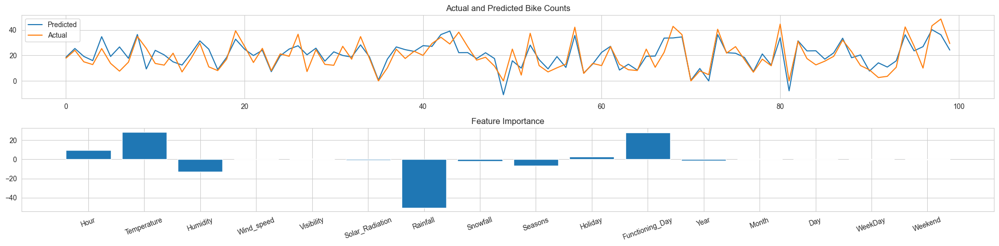

---------------------Lasso(alpha=0.0001)----------------------


,MSE,RMSE,MAE,Train_R2,Test_R2,Adjusted_R2
0,51.522429,7.177913,5.554526,0.547776,0.633671,0.630293


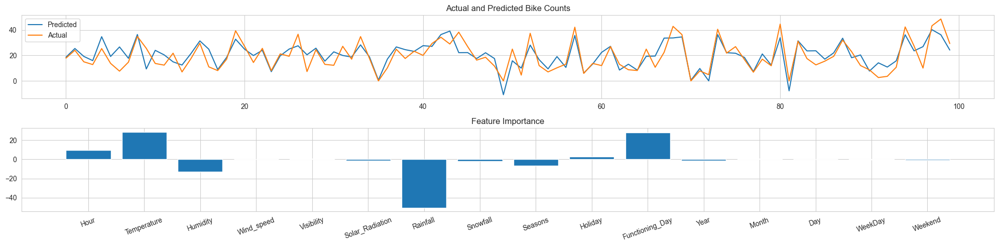

---------------------Ridge(alpha=0.1, solver='sag')----------------------


,MSE,RMSE,MAE,Train_R2,Test_R2,Adjusted_R2
0,51.535088,7.178794,5.555716,0.547644,0.633581,0.630202


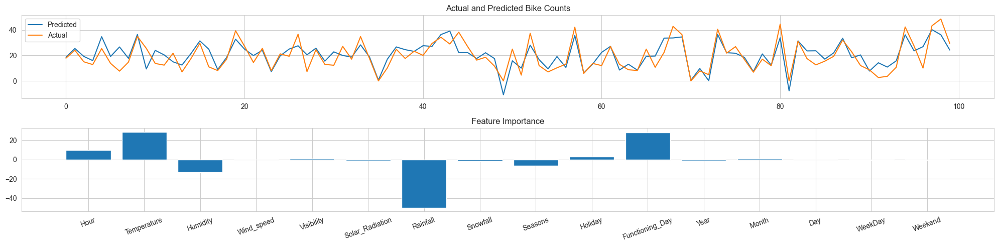

---------------------ElasticNet(alpha=0.0001, l1_ratio=1.0)----------------------


,MSE,RMSE,MAE,Train_R2,Test_R2,Adjusted_R2
0,51.522429,7.177913,5.554526,0.547776,0.633671,0.630293


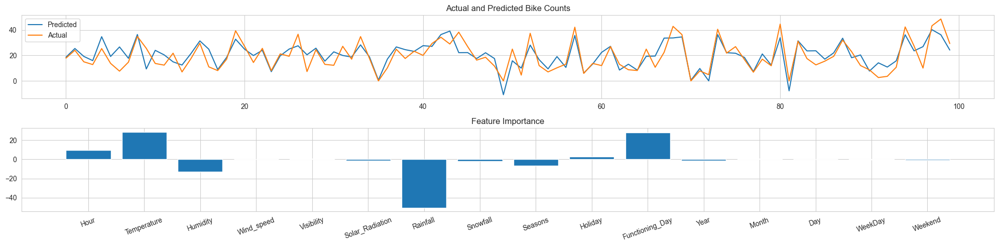

---------------------DecisionTreeRegressor(criterion='friedman_mse', max_depth=16)----------------------


,MSE,RMSE,MAE,Train_R2,Test_R2,Adjusted_R2
0,31.591389,5.620622,3.332619,0.948612,0.775383,0.773311


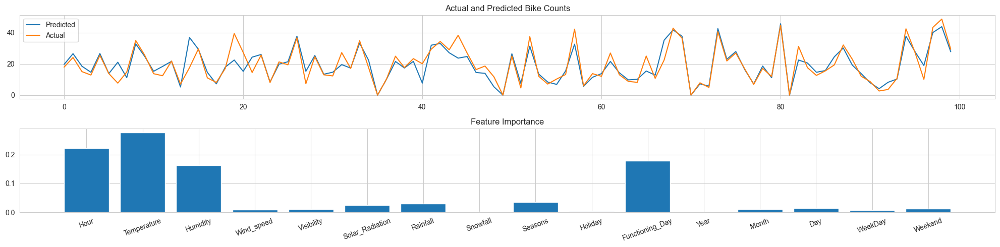

---------------------RandomForestRegressor(max_features=None, n_estimators=150)----------------------


,MSE,RMSE,MAE,Train_R2,Test_R2,Adjusted_R2
0,16.813973,4.100484,2.541205,0.97695,0.880451,0.879349


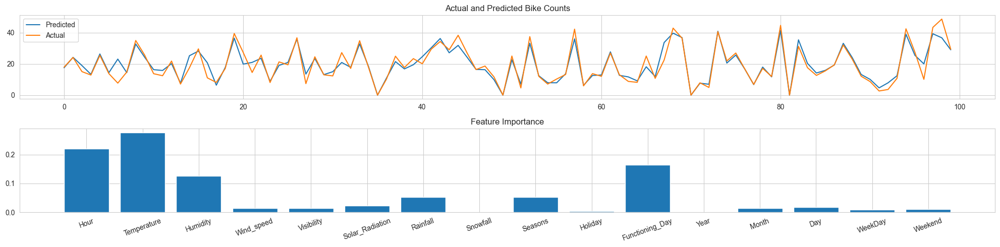

---------------------GradientBoostingRegressor(max_depth=10, min_samples_leaf=70, n_estimators=150,
                          random_state=4)----------------------


,MSE,RMSE,MAE,Train_R2,Test_R2,Adjusted_R2
0,16.448202,4.055638,2.552573,0.916574,0.883052,0.881973


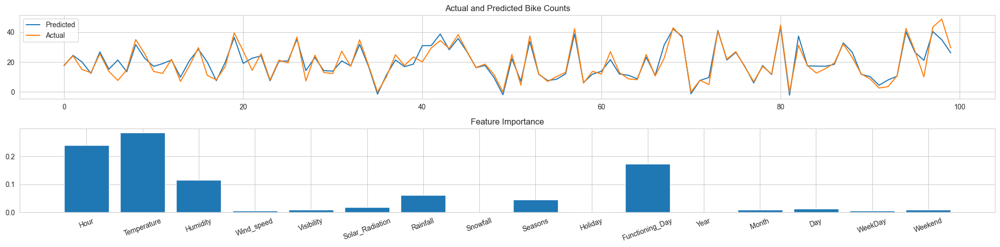

In [76]:
#independent_variables = [i for i in df.columns if i not in ['bike_count','Winter','Summer','dew_temp','hour','humidity']]
#independent_variables = [i for i in df.columns if i not in ['Rental_Bike_Count']]

#models =[LR, RF, GBR]
models = [LR,La,R, En, DT, RF,GBR]

for model in models:
    analyse_model(model, X_train, X_test, y_train, y_test)

### Model Fitting Comparision With K fold CrossValidation

In [77]:
# This function takes input of a list of models to checked and as a 2nd parameter it takes CV split value, 
# and returns a dataframes of average scores for all splits and all the models

def CrossValidation_model_comparision(models, feature_df, target_df, splits, scaler):
    
    # Printing model names which are compaired using this function
    
    models_compaired_df = pd.DataFrame()
    models_compaired_df["Models"] = [str(model).split('(')[0] for model in models]
    models_compaired_df["Parameters"] = ['(' + str(model).split('(')[1] for model in models]

    styles = [dict(selector="caption",
            props=[("text-align", "center"),
                   ("font-size", "130%"),
                   ("font-weight", "bold")])]

    models_compaired_df = models_compaired_df.style.set_caption('Models Compaired').set_table_styles(styles)
    display(models_compaired_df)


    # main dataframe (common_metric_df) to store average of all the metrics of all models    
    model_name_list = [str(model).split('(')[0] for model in models]
    cols = pd.MultiIndex.from_product([['Mean Absolute Error (MAE)','Mean Squared Error (MSE)','Root Mean Squared Error (RMSE)','r2_score'], ['Min', 'Max', 'Avg']])
    common_metric_df = pd.DataFrame(index = model_name_list, columns = cols)
    

    # Creating dataframes for all the scores and errors
    df_mae = pd.DataFrame()
    df_mse = pd.DataFrame()
    df_rmse = pd.DataFrame()
    df_r2 = pd.DataFrame()
    
    # Creating dictionary for all the scores dataframe and their names
    dfs = {'Mean Absolute Error (MAE)':df_mae, 
            'Mean Squared Error (MSE)':df_mse, 
            'Root Mean Squared Error (RMSE)':df_rmse, 
            'r2_score':df_r2 
            }
    
    
    # Function to get scores and errors of different models, and it returns a list containg the scores and errors
    def get_scores(model, X_train, X_test, y_train, y_test):
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        
        from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
        from numpy import math
        
        scores = []
        scores.append(mean_absolute_error(y_test,pred))
        scores.append(mean_squared_error(y_test,pred))
        scores.append(math.sqrt(mean_squared_error(y_test,pred)))
        scores.append(r2_score(y_test,pred))
        scores.append(model.score(X_test, y_test))

        return scores
    
    # function to apply Transformation
    def Scaler_function(X_train,X_test,scaler):

        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        
        return X_train_scaled,X_test_scaled

   
    
    from sklearn.model_selection import KFold
    kf = KFold(n_splits = splits)
    
    fold_count = 1 #(here i is the column num in dataframe of metrics, it will increase as no. of splits increases)
    
    # This loop will give us the index of train and test data on the basis of KFold   
    for train_index, test_index in kf.split(feature_df, target_df):
        X_train = feature_df.loc[train_index]
        X_test  = feature_df.loc[test_index]
        y_train = target_df.loc[train_index]
        y_test  = target_df.loc[test_index]

        X_train_scaled,X_test_scaled = Scaler_function(X_train,X_test, scaler)


        for model in models:
            all_scores = get_scores(model, X_train_scaled, X_test_scaled, y_train, y_test)
            
            metric_index = 0
            for name,metric in dfs.items():
                metric.loc[str(model).split('(')[0],fold_count] = all_scores[metric_index]
                metric_index = metric_index + 1
        
    
        fold_count = fold_count + 1
    
    for name,metric in dfs.items():
        metric['Average']  = metric.mean(axis=1)
        metric['Min']  = metric.min(axis=1) 
        metric['Max']  = metric.max(axis=1)
     
    for name,metric in dfs.items(): 
        common_metric_df[f'{name}','Avg'] = np.array(metric.loc[ :, 'Average'])
        common_metric_df[f'{name}','Min'] = np.array(metric.loc[ :, 'Min'])
        common_metric_df[f'{name}','Max'] = np.array(metric.loc[ :, 'Max'])
    
    # highlighting max and min
    common_metric_df_formated = common_metric_df.style.highlight_max(color = 'darkblue').highlight_min(color = 'darkred')\
                                                       .set_caption(f'Common Metrics Report After {splits} Fold Cross Validation')\
                                                       .set_table_styles(styles)
    
    display(common_metric_df_formated )
    print('**Blue are highest')
    print('**Red are Lowest')
    
    return common_metric_df

In [78]:
################################### 

In [80]:
models = [LR,La,R, En, DT, RF,GBR]
results = CrossValidation_model_comparision(models,X_data,y_data,10,scaler)

,Models,Parameters
0,LinearRegression,()
1,Lasso,(alpha=0.0001)
2,Ridge,"(alpha=0.1, solver='sag')"
3,ElasticNet,"(alpha=0.0001, l1_ratio=1.0)"
4,DecisionTreeRegressor,"(criterion='friedman_mse', max_depth=16)"
5,RandomForestRegressor,"(max_features=None, n_estimators=150)"
6,GradientBoostingRegressor,"(max_depth=10, min_samples_leaf=70, n_estimators=150, random_state=4)"


**Blue are highest
**Red are Lowest


In [81]:
# pickling the model
import pickle
pickle_out = open('GBR_model.pkl', "wb")
pickle.dump(GBR, pickle_out)
pickle_out.close()

In [82]:
# pickling the model
import pickle
pickle_out = open('scaler.pkl', "wb")
pickle.dump(scaler, pickle_out)
pickle_out.close()

In [43]:
df

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Year,Month,Day,WeekDay,Weekend
0,254.0,0,-5.2,37,2.2,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
1,204.0,1,-5.5,38,0.8,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
2,173.0,2,-6.0,39,1.0,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
3,107.0,3,-6.2,40,0.9,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
4,78.0,4,-6.0,36,2.3,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003.0,19,4.2,34,2.6,1894,0.0,0.0,0.0,Autumn,No Holiday,Yes,2018,11,30,Friday,No
8756,764.0,20,3.4,37,2.3,2000,0.0,0.0,0.0,Autumn,No Holiday,Yes,2018,11,30,Friday,No
8757,694.0,21,2.6,39,0.3,1968,0.0,0.0,0.0,Autumn,No Holiday,Yes,2018,11,30,Friday,No
8758,712.0,22,2.1,41,1.0,1859,0.0,0.0,0.0,Autumn,No Holiday,Yes,2018,11,30,Friday,No


### Conclusion

1. Functioning day is the most influencing feature and temperature is at the second place for LinearRegressor.
2. Temperature is the most important feature for DecisionTree, RandomForest and GradientBoosting Regressor.
3. Functioning day is the most important feature and Winter is the second most for XGBoostRegressor.
4. RMSE Comparisons:
    1. LinearRegressor RMSE : 370.46
    2. DecissionTreeRegressor RMSE : 302.53
    3. RandomForestRegressor RMSE : 290.02
    4. XGBoostRegressor RMSE : 242.72
    5. GradientBoostingRegressor RMSE : 248.18

5. The feature temperature is on the top list for all the regressors except XGBoost.
6. XGBoost is acting different from all the regressors as it is considering whether it is winter or not. And is it a working day or not. Though winter is also a function of temperature only but it seems this trick of XGBoost is giving better results.
7. XGBoostRegressor has the Least Root Mean Squared Error. So It can be considered as the best model for given problem.

# Project Summary

The project used data from the Seoul Bike Share System to build a machine learning model that could predict the demand for bike rentals in the city. The project involved several components, including exploratory data analysis (EDA), feature engineering, model selection and evaluation, and deployment of the model as a web app.

During EDA, the project identified several trends in the data, such as peaks in demand at 8:00 and 18:00, drops in demand on specific dates each month, and a preference for renting bikes in the morning and evening. The project also found that certain features in the data were highly skewed or had many zero values.

The project evaluated several machine learning models, including linear regression, elastic net, random forest regressor, decision tree regressor, and gradient boost regressor. The project used evaluation metrics such as mean squared error and R-squared to determine that the random forest regressor model performed the best.

To help automate the process of model selection and evaluation, the project defined several functions, including ModelSelection(), analyse_model(), and CrossValidation_model_comparision(). These functions helped to find the best hyperparameters for each model, evaluate the performance of the models, and compare the models using k-fold cross-validation.

Overall, the project successfully built a machine learning model to predict the demand for bike rentals in the Seoul Bike Share System, which can help to optimize the supply of bikes in the city.
